In [1]:
import pandas as pd
import numpy as np
import sklearn as sk

In [3]:
df = pd.read_csv('condensed_10.csv')
#party = pd.read_csv('user_party.csv')
raw =pd.read_csv('raw_10.csv')

C:\Users\torbe\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (123,193,275,332,333,334,335,336,337,338,339,340,341,351,354,355,358,361,364,365,366,367,368,369,370,371) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [678]:
pd.options.display.max_columns = 400
pd.options.display.max_rows = 40
pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [4]:
raw = raw.drop_duplicates(subset=["text", "user.id"])

In [395]:
raw

,Unnamed: 0,created_at,id,id_str,text,display_text_range,source,truncated,in_reply_to_status_id,in_reply_to_status_id_str,in_reply_to_user_id,in_reply_to_user_id_str,in_reply_to_screen_name,geo,coordinates,place,contributors,is_quote_status,retweet_count,favorite_count,favorited,retweeted,possibly_sensitive,filter_level,lang,timestamp_ms,user.id,user.id_str,user.name,user.screen_name,user.location,user.url,user.description,user.protected,user.verified,user.followers_count,user.friends_count,user.listed_count,user.favourites_count,user.statuses_count,user.created_at,user.utc_offset,user.time_zone,user.geo_enabled,user.lang,user.contributors_enabled,user.is_translator,user.profile_background_color,user.profile_background_image_url,user.profile_background_image_url_https,user.profile_background_tile,user.profile_link_color,user.profile_sidebar_border_color,user.profile_sidebar_fill_color,user.profile_text_color,user.profile_use_background_image,user.profile_image_url,user.profile_image_url_https,user.profile_banner_url,user.default_profile,user.default_profile_image,user.following,user.follow_request_sent,user.notifications,entities.hashtags,entities.urls,entities.user_mentions,entities.symbols,entities.media,extended_entities.media,retweeted_status.created_at,retweeted_status.id,retweeted_status.id_str,retweeted_status.text,retweeted_status.display_text_range,retweeted_status.source,retweeted_status.truncated,retweeted_status.in_reply_to_status_id,retweeted_status.in_reply_to_status_id_str,retweeted_status.in_reply_to_user_id,retweeted_status.in_reply_to_user_id_str,retweeted_status.in_reply_to_screen_name,retweeted_status.user.id,retweeted_status.user.id_str,retweeted_status.user.name,retweeted_status.user.screen_name,retweeted_status.user.location,retweeted_status.user.url,retweeted_status.user.description,retweeted_status.user.protected,retweeted_status.user.verified,retweeted_status.user.followers_count,retweeted_status.user.friends_count,retweeted_status.user.listed_count,retweeted_status.user.favourites_count,retweeted_status.user.statuses_count,retweeted_status.user.created_at,retweeted_status.user.utc_offset,retweeted_status.user.time_zone,retweeted_status.user.geo_enabled,retweeted_status.user.lang,retweeted_status.user.contributors_enabled,retweeted_status.user.is_translator,retweeted_status.user.profile_background_color,retweeted_status.user.profile_background_image_url,retweeted_status.user.profile_background_image_url_https,retweeted_status.user.profile_background_tile,retweeted_status.user.profile_link_color,retweeted_status.user.profile_sidebar_border_color,retweeted_status.user.profile_sidebar_fill_color,retweeted_status.user.profile_text_color,retweeted_status.user.profile_use_background_image,retweeted_status.user.profile_image_url,retweeted_status.user.profile_image_url_https,retweeted_status.user.profile_banner_url,retweeted_status.user.default_profile,retweeted_status.user.default_profile_image,retweeted_status.user.following,retweeted_status.user.follow_request_sent,retweeted_status.user.notifications,retweeted_status.geo,retweeted_status.coordinates,retweeted_status.place,retweeted_status.contributors,retweeted_status.is_quote_status,retweeted_status.retweet_count,retweeted_status.favorite_count,retweeted_status.entities.hashtags,retweeted_status.entities.urls,retweeted_status.entities.user_mentions,retweeted_status.entities.symbols,retweeted_status.entities.media,retweeted_status.extended_entities.media,retweeted_status.favorited,retweeted_status.retweeted,retweeted_status.possibly_sensitive,retweeted_status.filter_level,retweeted_status.lang,quoted_status_id,quoted_status_id_str,quoted_status.created_at,quoted_status.id,quoted_status.id_str,quoted_status.text,quoted_status.display_text_range,quoted_status.source,quoted_status.truncated,quoted_status.in_reply_to_status_id,quoted_status.in_reply_to_status_id_str,quoted_status.in_reply_to_user_id,quoted_status.in_reply_to_user_id_str,quoted_status.in_reply_

In [7]:
# Integrate new columns that are needed for tweet matching
condensed = raw[["in_reply_to_user_id",
     "quoted_status.user.id", "retweeted_status.user.id"]]

In [8]:
df = pd.concat([df,condensed.reset_index()],axis=1)

In [474]:
df

,id,created_at,user.id,user.screen_name,user.followers_count,text,in_reply_to_status_id,entities.hashtags,entities.user_mentions,quoted_status_id,retweeted_status.id,retweet_count,favorite_count,is_politician,author_party,index,in_reply_to_user_id,quoted_status.user.id,retweeted_status.user.id
0,892865330464382976,Wed Aug 02 21:50:58 +0000 2017,805053174621073408,TheBrutalinski,39,"@Volker_Beck Volker, keine Angst...wir vergess...",892863573843726336,[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",nan,nan,0,0,False,None,0,16337664,NaN,nan
1,892865401109041152,Wed Aug 02 21:51:14 +0000 2017,104100946,stephankuehn,2594,RT @tagesthemen: „Verlierer sind Verbraucher u...,nan,"[{'text': 'Dieselgipfel', 'indices': [76, 89]}]","[{'screen_name': 'tagesthemen', 'name': 'tages...",nan,892832648569270272,0,0,True,Grüne,1,NaN,NaN,2152983800
2,892865408990040066,Wed Aug 02 21:51:16 +0000 2017,873087474364329986,VormaerzV2,55,@Volker_Beck @AndyGER Sie wissen doch gar nich...,892864946173825024,[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",nan,nan,0,0,False,None,2,16337664,NaN,nan
3,892865416795754504,Wed Aug 02 21:51:18 +0000 2017,846997668,LongoFL,2760,RT @kahrs: der erste. gut so.\n„Die Zukunft is...,nan,[],"[{'screen_name': 'kahrs', 'name': 'Johannes Ka...",nan,892691513188265984,0,0,False,None,3,NaN,NaN,35687457
4,892865460026445824,Wed Aug 02 21:51:28 +0000 2017,37642893,ChristianHirte,2605,"Ach, aber von den Gewerkschaften, Umweltverbän...",nan,[],[],892713534047617024,nan,0,0,False,None,4,NaN,16705726,nan
5,892865527298883588,Wed Aug 02 21:51:45 +0000 2017,2596607377,Tina_B111,34,RT @SevimDagdelen: Wer es mit der Neuausrichtu...,nan,"[{'text': 'Erdogan', 'indices': [115, 123]}]","[{'screen_name': 'SevimDagdelen', 'name': 'Sev...",892794194653302784,892798455592169472,0,0,False,None,5,NaN,253526843,139407967
6,892865542272544768,Wed Aug 02 21:51:48 +0000 2017,753550900287897600,finis_euro,430,RT @AfD_Bund: #AfD-Bundessprecher Prof. @Joerg...,nan,"[{'text': 'AfD', 'indices': [14, 18]}, {'text'...","[{'screen_name': 'AfD_Bund', 'name': 'Alternat...",nan,892837201528180736,0,0,False,None,6,NaN,NaN,844081278
7,892865566138134529,Wed Aug 02 21:51:54 +0000 2017,1910675252,hmheiner,11,@SWagenknecht Jetzt kann man gespannt sein wie...,892840367820857344,[],"[{'screen_name': 'SWagenknecht', 'name': 'Sahr...",nan,nan,0,0,False,None,7,47375691,NaN,nan
8,892865617631612928,Wed Aug 02 21:52:06 +0000 2017,110774602,NerdyGerdyMan,800,RT @SWagenknecht: Mein Gastbeitrag zu den US-#...,nan,"[{'text': 'Sanktionen', 'indices': [45, 56]}, ...","[{'screen_name': 'SWagenknecht', 'name': 'Sahr...",nan,892840367820857344,0,0,False,None,8,NaN,NaN,47375691
9,892865622270513152,Wed Aug 02 21:52:07 +0000 2017,810900348214841348,HakanKaraaliog1,0,@SevimDagdelen utopie ! DE ist seit Mai 1945 e...,892298881454747648,[],"[{'screen_name': 'SevimDagdelen', 'name': 'Sev...",nan,nan,0,0,False,None,9,139407967,NaN,nan


In [413]:
#df['quoted_status_id']= df['quoted_status_id'].apply(lambda x: '%.0f' % x)
#df['in_reply_to_status_id']= df['in_reply_to_status_id'].apply(lambda x: '%.0f' % x)
#df['retweeted_status.id']= df['retweeted_status.id'].apply(lambda x: '%.0f' % x)
#df['retweeted_status.user.id']= df['retweeted_status.user.id'].apply(lambda x: '%.0f' % x)

In [9]:
# Matching works for in_reply_to_user_id
df.author_party[df['user.id']==df["in_reply_to_user_id"][0]].iloc[0]

'Grüne'

In [577]:
df2

,level_0,id,created_at,user.id,user.screen_name,user.followers_count,text,entities.hashtags,entities.user_mentions,retweet_count,favorite_count,is_politician,author_party,index,in_reply_to_user_id,quoted_status.user.id,retweeted_status.user.id,party_ref,party_ref2,party_ref3
0,0,892865330464382976,Wed Aug 02 21:50:58 +0000 2017,805053174621073408,TheBrutalinski,39,"@Volker_Beck Volker, keine Angst...wir vergess...",[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",0,0,False,None,0,16337664,NaN,nan,Grüne,NaN,NaN
1,1,892865401109041152,Wed Aug 02 21:51:14 +0000 2017,104100946,stephankuehn,2594,RT @tagesthemen: „Verlierer sind Verbraucher u...,"[{'text': 'Dieselgipfel', 'indices': [76, 89]}]","[{'screen_name': 'tagesthemen', 'name': 'tages...",0,0,True,Grüne,1,NaN,NaN,2152983800,NaN,NaN,NaN
2,2,892865408990040064,Wed Aug 02 21:51:16 +0000 2017,873087474364329984,VormaerzV2,55,@Volker_Beck @AndyGER Sie wissen doch gar nich...,[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",0,0,False,None,2,16337664,NaN,nan,Grüne,NaN,NaN
3,38,892866568014766080,Wed Aug 02 21:55:53 +0000 2017,873087474364329984,VormaerzV2,55,@Volker_Beck @AndyGER Der Fehler ist schon Men...,[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",0,0,False,None,38,873087474364329984,NaN,nan,None,NaN,NaN
4,5167,893060562388692992,Thu Aug 03 10:46:44 +0000 2017,873087474364329984,VormaerzV2,54,@Volker_Beck @ntvde bin schon gespannt wohin s...,[],"[{'screen_name': 'Volker_Beck', 'name': 'Volke...",0,0,False,None,5173,16337664,NaN,nan,Grüne,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9803,NaN,NaN,NaN,891358444086841344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,Linke,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9804,NaN,NaN,NaN,892319704089587712,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,Linke,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9805,NaN,NaN,NaN,892809359834533888,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,Neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9806,NaN,NaN,NaN,892876234543308800,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,Neutral,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [576]:
# Works in some cases for retweeted_status.user.id
df2.author_party[df2['user.id']== 21197524].iloc[0]

'Grüne'

In [487]:
# Works in some cases for quoted_status.user.id
df.author_party[df['user.id']== 30050484].iloc[0]

'SPD'

In [292]:
# Check, if quoted_user.id is correct referral or quoted_status_id, as is given in condensed
raw[raw['user.id']==23248102.0]['user.id']

1696    23248102
4884    23248102
4902    23248102
5518    23248102
9009    23248102
9358    23248102
9386    23248102
9405    23248102
9475    23248102
9486    23248102
Name: user.id, dtype: int64

In [10]:
# Delete incorrectly imported columns
df.drop(columns=['in_reply_to_status_id','quoted_status_id','retweeted_status.id'],inplace=True)

In [11]:
df["retweeted_status.id"][9487]

KeyError: 'retweeted_status.id'

In [12]:
df.shape[0]+party.shape[0]

NameError: name 'party' is not defined

In [114]:
# Only 300 unique users even though it should be 317?
party['user.id'].nunique()

300

In [492]:
# Idea: Maybe referral does not work, because people are replying to OG tweets, that are not part of the selected chunk, so we need to load also the user.id of politicians without OG tweet in chunk
df_n = df.join(party, how='outer', on='user.id',rsuffix='_r')

In [493]:
# shape matches with df.shape[0]+party.shape[0]
df_n.shape

(9808, 19)

In [494]:
df_n.reset_index(inplace=True)

In [495]:
df_n[df_n['user.id']==1].index[0]

9492

In [543]:
# Putting together parts of the outer join
lower = df_n.iloc[df_n[df_n['user.id']==1].index[0]-1:] 
upper = df_n.iloc[:df_n[df_n['user.id']==1].index[0]-1]
lower['user.id'] = lower['user.id_r']
lower['is_politician'] = True
lower['author_party'] = lower.Party
upper = df_n.iloc[:df_n[df_n['user.id']==1].index[0]-1]

C:\Users\torbe\AppData\Local\Temp/ipykernel_33536/1246764798.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lower['user.id'] = lower['user.id_r']
C:\Users\torbe\AppData\Local\Temp/ipykernel_33536/1246764798.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lower['is_politician'] = True
C:\Users\torbe\AppData\Local\Temp/ipykernel_33536/1246764798.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

Se

In [497]:
# Shape matches
upper.shape[0]+lower.shape[0]

9808

In [544]:
# df2 doesnt seem to be necessary 
df2 =pd.concat([upper,lower])
df2.drop(columns=['user.id_r','Party','weight'],inplace=True)
df2['is_politician'] = df2.is_politician.astype('bool')

In [13]:
# get List of all referred parties corresponding to tweet
def get_refs(column):
    helper=[]
    for el in df[column].astype('float'):
        if not np.isnan(el):
            try:
                helper.append(df.author_party[df['user.id']==el].iloc[0])
            except:
                helper.append(np.NaN)
        else:
            helper.append(np.NaN)
    return helper

In [14]:
a = get_refs('in_reply_to_user_id')
b = get_refs('quoted_status.user.id')
c = get_refs('retweeted_status.user.id')

In [15]:
df['party_ref'] = a
df['party_ref2'] = b
df['party_ref3'] = c

In [16]:
# List of all parties
parties=['Grüne','None','Linke','SPD','CDU/CSU','FDP','AfD']
columns = ['party_ref2','party_ref3']

In [17]:
for col in columns:
    for par in parties:
        df.loc[df[col] == par, 'party_ref'] = par

In [18]:
# drop helper columns
df.drop(columns=['party_ref2','party_ref3'],inplace=True)

In [532]:
# WIP: Write Function that assigns to column "party_ref" the party that the OG Tweet owner belongs to
#df2_n = df2.assign(party_ref=lambda x: df2.author_party[df2['user.id']==x['in_reply_to_user_id']])
#df2_n = df2.assign(party_ref3=lambda x: df2.author_party[df2['user.id']==x['retweeted_status.user.id']])
#df2_n = df2.assign(party_ref2=lambda x: df2.author_party[df2['user.id']==x['quoted_status.user.id']])

In [285]:
# does not work becasue we need in_reply_to_user_id!
df2[df2['id']==df2['in_reply_to_status_id'][9488]]['author_party']

Series([], Name: author_party, dtype: object)

In [19]:
# Sort values before grouping for time series
df.sort_values('created_at',inplace=True)

In [20]:
# How many tweets were posted my members of a party?
partytweets = df.groupby('author_party').count()[['id']] # doesnt just count OG tweets but also retweets, etc.
partytweets.drop('None',axis=0,inplace=True)
partytweets

,id
author_party,
AfD,43
CDU/CSU,167
FDP,46
Grüne,215
Linke,134
SPD,218


In [21]:
#get OG Tweets by politicians
OG= df.loc[df['is_politician']& df['in_reply_to_user_id'].isna()&df['quoted_status.user.id'].isna()&df['retweeted_status.user.id'].isna()]
OG_grp =OG.groupby('author_party').count()[['id']]
OG_grp

,id
author_party,
AfD,2
CDU/CSU,51
FDP,10
Grüne,43
Linke,41
SPD,71


In [22]:
# how much reactions/traffic did they generate?
react= df.groupby('party_ref').count()[['id']]
react.drop('None',axis=0,inplace=True)
react

,id
party_ref,
AfD,111
CDU/CSU,488
FDP,501
Grüne,982
Linke,833
SPD,1196


In [23]:
# Compute KPI : Reactions/taffic per tweet
KPI1= pd.concat([react, OG_grp, partytweets],axis=1)
KPI1.columns = ['reactions','party_output_OG','party_output']
KPI1['React_per_Tweet'] = KPI1.reactions/KPI1.party_output
KPI1['React_per_OG_Tweet'] = KPI1.reactions/KPI1.party_output_OG
KPI1['share_OG'] = KPI1.party_output_OG/(KPI1.party_output_OG + KPI1.party_output)

In [24]:
KPI1

,reactions,party_output_OG,party_output,React_per_Tweet,React_per_OG_Tweet,share_OG
AfD,111,2,43,2.581395,55.500000,0.044444
CDU/CSU,488,51,167,2.922156,9.568627,0.233945
FDP,501,10,46,10.891304,50.100000,0.178571
Grüne,982,43,215,4.567442,22.837209,0.166667
Linke,833,41,134,6.216418,20.317073,0.234286
SPD,1196,71,218,5.486239,16.845070,0.245675


In [755]:
#KPI1.to_csv("KPIs_Parties.csv", index=False)
#raw.to_csv('raw_10.2.csv', index=False)
#df.to_csv('condensed_reaction.csv',index=False)

In [25]:
df['created_at'] = pd.to_datetime(df['created_at'])

In [700]:
#df['retweeted_status.user.id'] = df2['retweeted_status.user.id'].astype('float64')

In [26]:
#  this is what we want to work on:  grouped by Timeslot and Party -> New party column that hold referred party, should never be "Neutral"
timeseries = df.groupby([pd.Grouper(key="created_at", freq="30min"),
          pd.Grouper('party_ref')]).count()[['user.id']].reset_index().rename(columns={'created_at':'timestamp','author_party':'Party','user.id':'Count'})

In [27]:
timeseries

,timestamp,party_ref,Count
0,2017-06-28 00:00:00+00:00,None,1
1,2017-06-28 00:00:00+00:00,SPD,1
2,2017-06-28 00:30:00+00:00,FDP,1
3,2017-06-28 00:30:00+00:00,Grüne,2
4,2017-06-28 00:30:00+00:00,Linke,1
...,...,...,...
350,2017-09-08 09:30:00+00:00,AfD,3
351,2017-09-08 09:30:00+00:00,CDU/CSU,15
352,2017-09-08 09:30:00+00:00,Grüne,3
353,2017-09-08 09:30:00+00:00,Linke,4


In [28]:
timeseries_p= timeseries.pivot(index='timestamp', columns='party_ref', values='Count')

In [29]:
timeseries_p.drop('None',axis=1,inplace=True)

<AxesSubplot:xlabel='timestamp'>

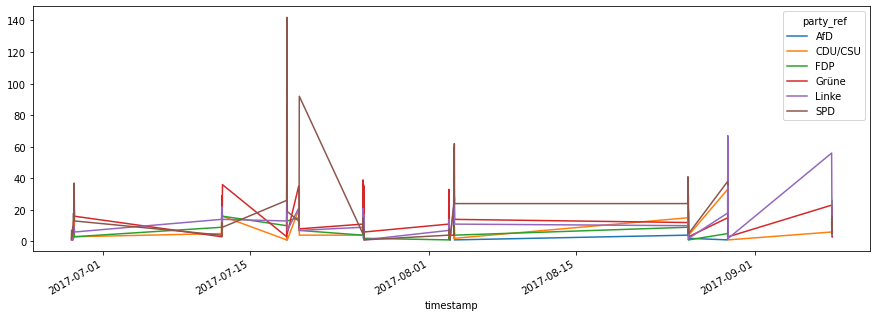

In [30]:
timeseries_p.plot(figsize=(15, 5))

In [31]:
# For testing: Time Series for all Parties
timeseries2 = df.groupby(pd.Grouper(key="created_at", freq="30min")).count()[['user.id']].rename(columns={'user.id':'count'})

In [32]:
timeseries2

,count
created_at,
2017-06-28 00:00:00+00:00,2
2017-06-28 00:30:00+00:00,33
2017-06-28 01:00:00+00:00,8
2017-06-28 01:30:00+00:00,14
2017-06-28 02:00:00+00:00,13
...,...
2017-09-08 07:30:00+00:00,0
2017-09-08 08:00:00+00:00,317
2017-09-08 08:30:00+00:00,286


<AxesSubplot:xlabel='created_at'>

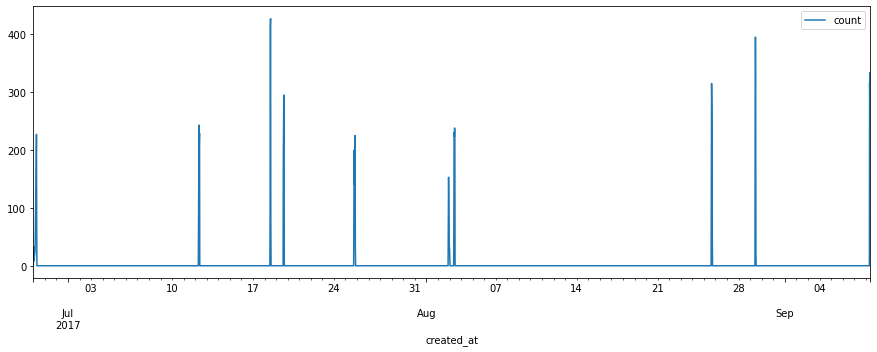

In [35]:
timeseries2.plot(figsize=(15,5))

# Hashtag Count

In [347]:
#unpack Hashtags
df_helper= df[['entities.hashtags']]

In [218]:
#eval(df_helper.iloc[0].values[0])[0]

In [348]:
hashtags = []
for i, x in enumerate(df_helper['entities.hashtags']):
    for k, j in enumerate(eval(df_helper.iloc[df_helper.index.tolist()[i]].values[0])):
        hashtags.append(j.get('text'))

In [349]:
Hashcounter = pd.DataFrame({'Hashtags':hashtags})
Hashcounter['Hash_lower'] = Hashcounter['Hashtags'].apply(str.lower)
Hashgrouper = Hashcounter.groupby('Hash_lower').count().sort_values('Hashtags',ascending=False).head()
Hashgrouper['%_Gesamt_Tweets'] = Hashgrouper.apply(lambda x: (x/Hashcounter.shape[0]).round(3))

In [350]:
Hashgrouper

,Hashtags,%_Gesamt_Tweets
Hash_lower,,
afd,1120,0.148
btw17,489,0.065
traudichdeutschland,433,0.057
spd,213,0.028
ehefueralle,138,0.018


## Integrate Separation for Parties

In [335]:
# Generate for every Party the sub-DataFrame
l = [] 
for it in df.party_ref.unique(): # loop over Parties
    el = df[['entities.hashtags']][df['party_ref']== it] # slice only tweets related to party
    el.reset_index(inplace=True,drop=True) 
    hashtags = [] 
    for i, x in enumerate(el['entities.hashtags']): # loop over every tweet
        for k, j in enumerate(eval(el.iloc[el.index.tolist()[i]].values[0])): # loop over every hashtag in that tweet
            hashtags.append(j.get('text')) # write Hashtag to list
    Hashcounter = pd.DataFrame({'Hashtags':hashtags}) 
    Hashcounter['Hash_lower'] = Hashcounter['Hashtags'].apply(str.lower) # Save lowercase as preparation for count
    Hashgrouper = Hashcounter.groupby('Hash_lower').count().sort_values('Hashtags',ascending=False).head() # save top 5 counts
    Hashgrouper['%_Gesamt_Tweets'] = Hashgrouper.apply(lambda x: (x/Hashcounter.shape[0]).round(3)) # save percentage of all hashtags
    Hashgrouper.rename(columns={'Hashtags':it},inplace=True)
    l.append(Hashgrouper)

In [345]:
# {0:Linke,1:None,2:SPD,3:CDU/CSU,4:NaN,5:Grüne,6:FDP,7:FDP}
l[0]

,Linke,%_Gesamt_Tweets
Hash_lower,,
türkei,93,0.115
eu,55,0.068
spd,39,0.048
erdogan,31,0.038
sanktionen,22,0.027
